## Alireza Farajtabrizi (97102185) and Mohmmadreza Alimohammadi (97102106) Lab5



### Importing libraries

In [2]:
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt
import os

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Part 1

### Import and Plot Images


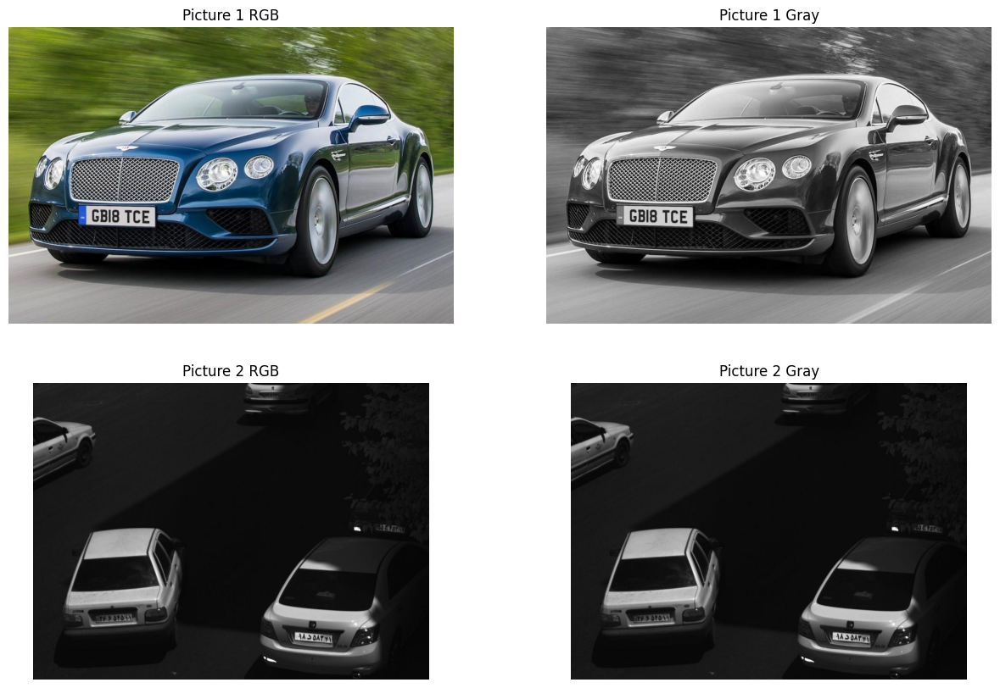

In [3]:
from os import listdir
from skimage import io

# get the path/directory
folder_dir = 'pics'
images = []

for file in os.listdir(folder_dir):
        img=io.imread(folder_dir+'/'+file,)
        images.append(img)

color_img_1 = images[0]
color_img_2 = images[1]
gray_img_1 = cv2.cvtColor(color_img_1, cv2.COLOR_BGR2GRAY)
gray_img_2 = cv2.cvtColor(color_img_2, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15,10)) 

plt.subplot(2, 2, 1)
plt.title('Picture 1 RGB')
plt.imshow(color_img_1)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Picture 1 Gray')
plt.imshow(gray_img_1, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Picture 2 RGB')
plt.imshow(color_img_2)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Picture 2 Gray')
plt.imshow(gray_img_2, cmap='gray')
plt.axis('off')
plt.show()

### Smoothing Filters (Image 1)

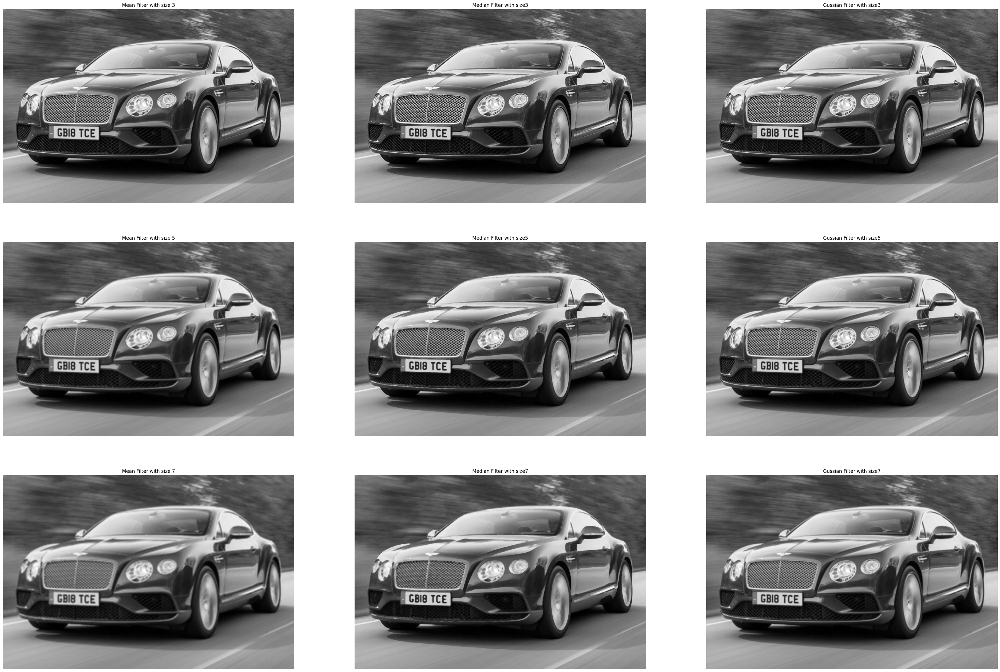

In [4]:
plt.figure(figsize=(45,30))
img = gray_img_1
for i in range(1,4):   
    Mean_img = cv2.blur(img,(i*2+1,i*2+1))
    Median_img = cv2.medianBlur(img,i*2+1)
    Gussian_img = cv2.GaussianBlur(img,(i*2+1,i*2+1),0)
    
    plt.subplot(3, 3, i*3-2)
    plt.title('Mean Filter with size ' + str(i*2+1))
    plt.imshow(Mean_img, cmap='gray')
    plt.axis('off') 
    
    plt.subplot(3, 3, i*3-1)
    plt.title('Median Filter with size'  + str(i*2+1))
    plt.imshow(Median_img, cmap='gray')
    plt.axis('off') 
    
    plt.subplot(3, 3, i*3)
    plt.title('Gussian Filter with size' + str(i*2+1))
    plt.imshow(Gussian_img, cmap='gray')
    plt.axis('off') 
    
plt.show()

مدین تیزی هارو گرد می کند ولی در سایز های پایین تاثیرش حس نمی شوداما وضوح تصویر رو خیلی پایین نمی اورد فیلتر میانگین گیر ولی تصویر رو تار و محو می کند اما به تیزی و گردی کاری ندارد و در نهایت فیلتر گوسی نویز تصویر را می گیرد و کمی آن را واضح تر می کند

### Smoothing Filters (Image 2)

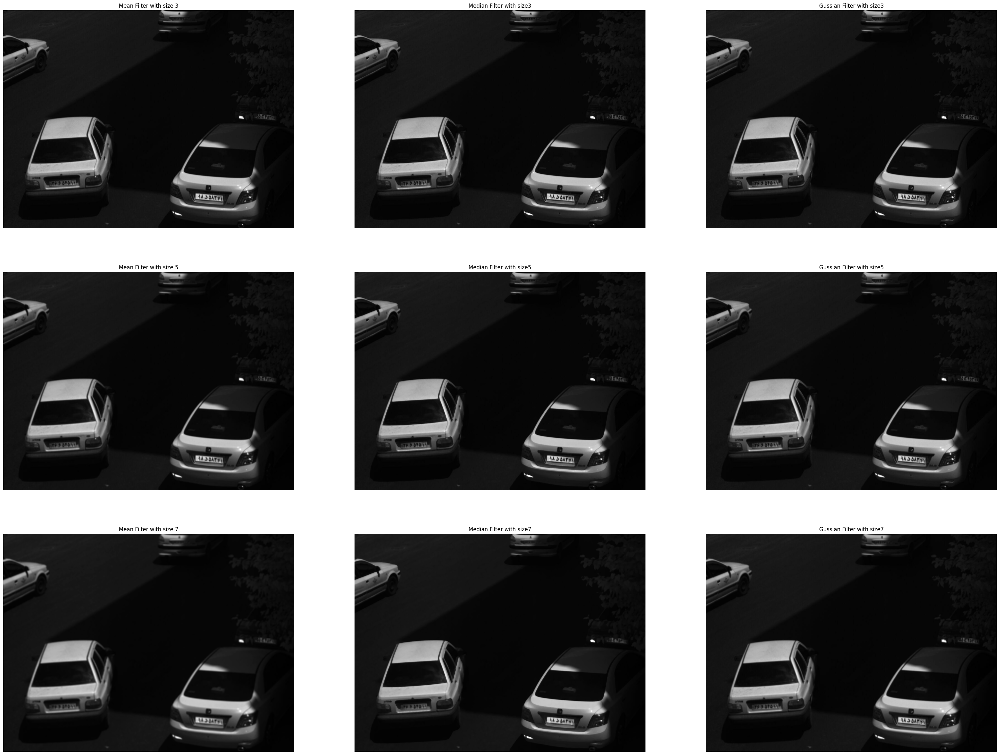

In [5]:
plt.figure(figsize=(40,30))
img = gray_img_2
for i in range(1,4):   
    Mean_img = cv2.blur(img,(i*2+1,i*2+1))
    Median_img = cv2.medianBlur(img,i*2+1)
    Gussian_img = cv2.GaussianBlur(img,(i*2+1,i*2+1),0)
    
    plt.subplot(3, 3, i*3-2)
    plt.title('Mean Filter with size ' + str(i*2+1))
    plt.imshow(Mean_img, cmap='gray')
    plt.axis('off') 
    
    plt.subplot(3, 3, i*3-1)
    plt.title('Median Filter with size'  + str(i*2+1))
    plt.imshow(Median_img, cmap='gray')
    plt.axis('off') 
    
    plt.subplot(3, 3, i*3)
    plt.title('Gussian Filter with size' + str(i*2+1))
    plt.imshow(Gussian_img, cmap='gray')
    plt.axis('off') 
    
plt.show()

## Part 2

### Edge Detection (Image 1)

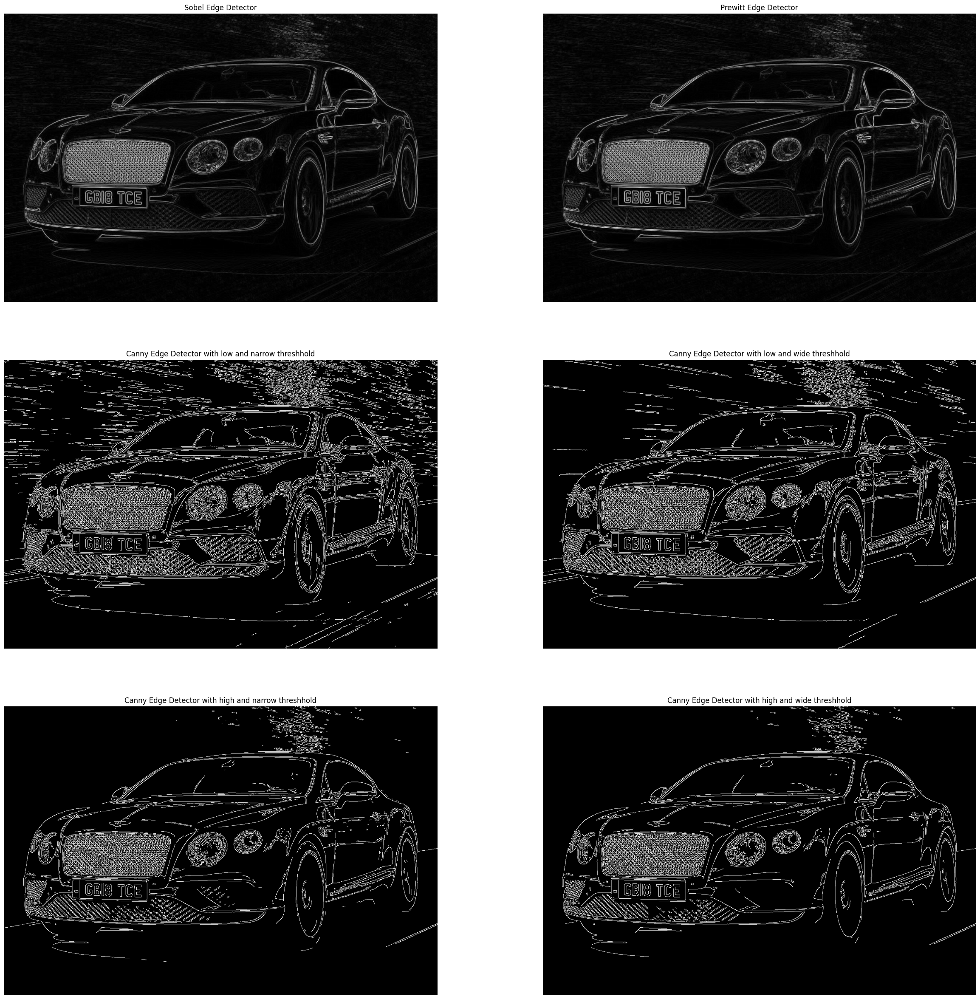

In [6]:
img = gray_img_1

sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1)
sobel = cv2.sqrt(cv2.addWeighted(cv2.pow(sobelx, 2.0), 1.0, cv2.pow(sobely, 2.0), 1.0, 0.0))
#sobel = (sobel*255.0/sobel.max()).astype('uint8')

kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewittx = cv2.filter2D(img, cv2.CV_64F, kernelx)
prewitty = cv2.filter2D(img, cv2.CV_64F, kernely)
prewitt = cv2.sqrt(cv2.addWeighted(cv2.pow(prewittx, 2.0), 1.0, cv2.pow(prewitty, 2.0), 1.0, 0.0))

canny1 = cv2.Canny(img, 50, 100)
canny2 = cv2.Canny(img, 50, 150)
canny3 = cv2.Canny(img, 150, 200)
canny4 = cv2.Canny(img, 150, 250)


plt.figure(figsize=(30,30))
plt.subplot(3, 2, 1)
plt.title('Sobel Edge Detector')
plt.imshow(sobel, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 2)
plt.title('Prewitt Edge Detector')
plt.imshow(prewitt, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 3)
plt.title('Canny Edge Detector with low and narrow threshhold')
plt.imshow(canny1, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 4)
plt.title('Canny Edge Detector with low and wide threshhold')
plt.imshow(canny2, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 5)
plt.title('Canny Edge Detector with high and narrow threshhold')
plt.imshow(canny3, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 6)
plt.title('Canny Edge Detector with high and wide threshhold')
plt.imshow(canny4, cmap='gray')
plt.axis('off') 
plt.show()

### Edge Detection (Image 2)

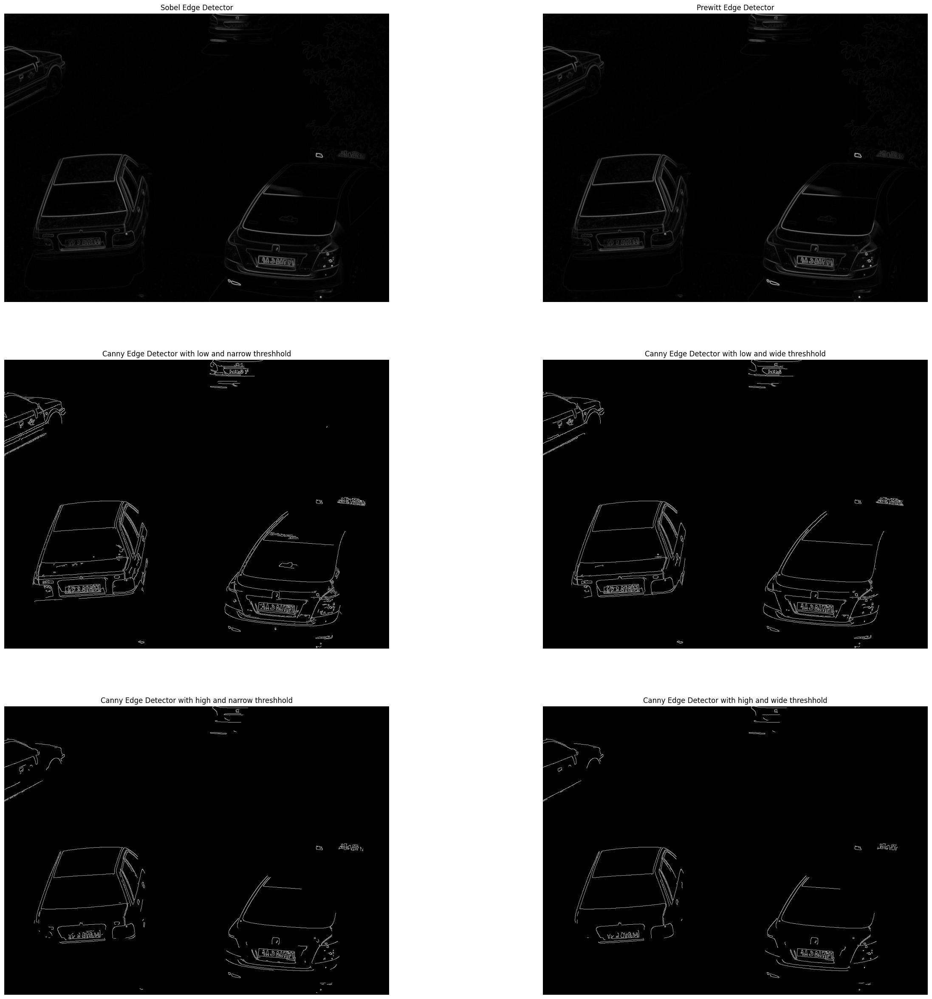

In [7]:
img = gray_img_2

sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1)
sobel = cv2.sqrt(cv2.addWeighted(cv2.pow(sobelx, 2.0), 1.0, cv2.pow(sobely, 2.0), 1.0, 0.0))
#sobel = (sobel*255.0/sobel.max()).astype('uint8')

kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewittx = cv2.filter2D(img, cv2.CV_64F, kernelx)
prewitty = cv2.filter2D(img, cv2.CV_64F, kernely)
prewitt = cv2.sqrt(cv2.addWeighted(cv2.pow(prewittx, 2.0), 1.0, cv2.pow(prewitty, 2.0), 1.0, 0.0))

canny1 = cv2.Canny(img, 50, 100)
canny2 = cv2.Canny(img, 50, 150)
canny3 = cv2.Canny(img, 150, 200)
canny4 = cv2.Canny(img, 150, 250)


plt.figure(figsize=(30,30))
plt.subplot(3, 2, 1)
plt.title('Sobel Edge Detector')
plt.imshow(sobel, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 2)
plt.title('Prewitt Edge Detector')
plt.imshow(prewitt, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 3)
plt.title('Canny Edge Detector with low and narrow threshhold')
plt.imshow(canny1, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 4)
plt.title('Canny Edge Detector with low and wide threshhold')
plt.imshow(canny2, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 5)
plt.title('Canny Edge Detector with high and narrow threshhold')
plt.imshow(canny3, cmap='gray')
plt.axis('off') 

plt.subplot(3, 2, 6)
plt.title('Canny Edge Detector with high and wide threshhold')
plt.imshow(canny4, cmap='gray')
plt.axis('off') 
plt.show()

دو فیلتر سوبل و پروویت مشابه هم عمل می کنند اما فیلتر کنی متفاوت است و بسه به میزان ترشهولد ها و فاصله ی مین و ماکس عملکردش تغییر می کند اگر فاصله دو مقدار را زیاد بگذاریم عملکرد بهتر می شود و اگر هر دو ترشهولد اعداد کمی باشند حساسیت بیشتر می شود و خطوط بیشتری مرز حساب می شوند

## Part 3

In [41]:
cap = cv2.VideoCapture('video4.mp4')
back = cv2.imread('back4.jpg')

if (cap.isOpened()== False):
    print("Error opening video file")

while(cap.isOpened()):
     
    ret, frame = cap.read()
    if ret == True:
        
        backless_frame = frame - back
        gray_frame = cv2.cvtColor(backless_frame, cv2.COLOR_BGR2GRAY)
        (thresh,binary_frame) = cv2.threshold(gray_frame, 127, 255, cv2.THRESH_BINARY)
        
        kernel = np.ones((5,5),np.uint8)
        
        erosion = cv2.erode(binary_frame,kernel,iterations = 1)
        dilation = cv2.dilate(erosion,kernel,iterations = 15)
        final_mask = cv2.erode(dilation,kernel,iterations = 10)
        
        final_fram = cv2.bitwise_and(frame,frame,mask = final_mask)
        
        cv2.imshow('Frame', final_fram)
     
        if cv2.waitKey(50) & 0xFF == ord('q'):
            break
 
    else:
        break
        
cap.release()

cv2.destroyAllWindows()

اگر ابتدا بدون هیچ اروژن یا دیلیشن فریم هارو نمایش بدیم نقاطی را می بینیم که باید سیاه باشند اما سفیداند و نقاط سیاهی نیز در وسط چهره موجود اند اول آن نقاط سفید اشتباهی را با ایتریشن کافی از اروژن به طور کامل حذف می کنیم سپس با ایتریشن کافی از دیلیشن نقاط سیاه اشتباهی را حذف میکنیم و در نهایت چون ایتریشن های زیاد از دیلیشن برای حذف نقاط سیاه استفاده شده بود حاشیه ی مرزی بزرگی اطراف چهره شکل میگیرد که با ایتریشن کافی از ایرود آن را اصلاح می کنیم.